# <Project Name> Análisis Avanzado de Jugadores en la Bundesliga Utilizando PCA y Clustering K-Means

## Índice

0. Introducción - pg. 
1. Análisis Descriptivo del Conjunto de Datos - pg. 
2. Análisis de Componentes Principales - pg. 
3. Clusterización por K-Means - pg.
4. Conclusiones Generales - pg.
5. Bibliografía - pg. 

## Introducción

En este proyecto se realiza un análisis profundo sobre los jugadores de la Bundesliga presentes en la temporada 2023 - 2024. El conjunto de datos corresponde a los jugadores activos de la liga de fútbol alemana, y sus respectivas estadísticas acumuladas en los juegos de la temporada 2024 a 2024. La base de datos se extrajo del proovedor de datos de fúbtol *Wyscout*. Respecto a los datos, el conjunto de datos contiene variables para identificar a los jugadores; como sus nombres, equipos, posiciones dentro del campo, edad, lugar de nacimiento, etc. variables que describen sus atributos físicos, como la estatura o el peso, así como más de 100 variables que describen sus estadísticas, como minutos jugados, goles, asistencias, regates completados, acciones defensivas completadas, entre otras.
Los análisis que se realizaran sobre estos datos, son el Análisis de Componentes Principales, o *PCA* por sus sigas en inglés, y el análisis de clusterización por K medias, o conocido como *K-Means* en inglés.
El objetivo de estos análisis será el de segmentar a los jugadores de la Bundesliga en grupos basados en sus características y desempeño en los partidos, a través del algoritmo K medias, habiendo previamente reducido o resumido el gran volumen de características que los describen, por medio del Análisis de Componentes Principales.

## Análisis Descriptivo del Conjunto de Datos

### Lectura de los Datos y Descripción básica de las variables

In [1]:
import pandas as pd

# URL of the CSV file in the GitHub repository
url = 'https://raw.githubusercontent.com/griffisben/Wyscout_Prospect_Research/main/Main%20App/Bundesliga%2023-24.csv'

# Read the CSV file into a DataFrame
data = pd.read_csv(url)
data = data[data['Competition'] == 'Bundesliga']

# Display the first few rows of the DataFrame
data.head()

,Player,Full name,Wyscout id,Team,Team within selected timeframe,Team logo,Competition,Position,Primary position,"Primary position, %",...,Prevented goals per 90,Back passes received as GK per 90,Exits per 90,Aerial duels per 90.1,Free kicks per 90,Direct free kicks per 90,"Direct free kicks on target, %",Corners per 90,Penalties taken,"Penalty conversion, %"
0,O. Baumann,Oliver Baumann,54482,Hoffenheim,Hoffenheim,https://cdn5.wyscout.com/photos/team/public/33...,Bundesliga,GK,GK,100,...,0.089,0.00,1.27,0.29,NaN,NaN,NaN,0.0,0,0.0
1,F. Rønnow,Frederik Rønnow,158351,Union Berlin,Union Berlin,https://cdn5.wyscout.com/photos/team/public/11...,Bundesliga,GK,GK,100,...,-0.084,0.00,2.19,0.49,NaN,NaN,NaN,0.0,0,0.0
2,N. Atubolu,Noah Atubolu,-62079,Freiburg,Freiburg,https://cdn5.wyscout.com/photos/team/public/33...,Bundesliga,GK,GK,100,...,-0.240,0.00,1.17,0.33,NaN,NaN,NaN,0.0,0,0.0
3,M. Riemann,Manuel Riemann,38391,Bochum,Bochum,https://cdn5.wyscout.com/photos/team/public/97...,Bundesliga,GK,GK,100,...,-0.146,0.00,1.54,0.65,NaN,NaN,NaN,0.0,0,0.0
4,W. Pacho,Willian Joel Pacho Tenorio,-74304,Eintracht Frankfurt,Eintracht Frankfurt,https://cdn5.wyscout.com/photos/team/public/9_...,Bundesliga,"LCB3, LCB",LCB3,60,...,NaN,2.43,NaN,3.50,0.0,0.0,0.0,0.0,0,0.0


La tabla 1.1 muestra las primas 5 filas del conjunto de datos.

Después de la lectura arbitrariamente se excluyen a los porteros del análisis, ya que no es de interés en este estudio agruparlos en características similares. La exclusión de los porteros incluye las variables que son inherentes a la posición, y por ende no afectan a los jugadores con distintas posiciones.

In [ ]:
data = data[data['Position'] != 'GK']
data = data.drop(['Conceded goals','Shots against', 'Clean sheets','xG against','Prevented goals','Conceded goals per 90','Shots against per 90', 'xG against per 90','Save rate, %','Back passes received as GK per 90','Prevented goals per 90','Exits per 90'], axis=1)
data.head()

In [127]:
data.describe()

,Wyscout id,"Primary position, %","Secondary position, %","Third position, %",Age,Market value,Matches played,Minutes played,Goals,xG,...,"Accurate progressive passes, %","Accurate vertical passes, %",Vertical passes per 90,Aerial duels per 90.1,Free kicks per 90,Direct free kicks per 90,"Direct free kicks on target, %",Corners per 90,Penalties taken,"Penalty conversion, %"
count,398.00000,398.000000,398.000000,398.000000,398.000000,3.980000e+02,398.000000,398.000000,398.000000,398.000000,...,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,389.000000,398.000000,398.000000
mean,202952.20603,58.452261,18.183417,6.761307,26.020101,1.029045e+07,21.314070,1477.791457,2.329146,2.411884,...,69.152005,83.562314,12.874165,3.524242,0.195013,0.031311,3.667044,0.410206,0.243719,7.265495
std,227386.12550,22.447621,11.459227,7.988708,3.978481,1.579616e+07,8.937474,901.394757,3.789779,3.187303,...,13.548982,12.263529,7.989859,2.471538,0.469854,0.089498,14.655689,0.976924,0.850780,25.116804
min,-414418.00000,13.000000,0.000000,0.000000,17.000000,0.000000e+00,1.000000,10.000000,0.000000,0.000000,...,0.000000,0.000000,0.980000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-44600.25000,40.000000,12.000000,0.000000,23.000000,1.800000e+06,15.000000,702.000000,0.000000,0.460000,...,64.000000,75.970000,7.430000,1.930000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,259753.00000,56.000000,19.000000,0.000000,26.000000,4.750000e+06,23.000000,1482.000000,1.000000,1.440000,...,71.050000,85.710000,10.920000,2.930000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,400728.75000,75.000000,26.000000,14.000000,29.000000,1.200000e+07,29.000000,2229.750000,3.000000,2.930000,...,76.190000,93.330000,16.630000,4.240000,0.120000,0.000000,0.000000,0.200000,0.000000,0.000000
max,519188.00000,100.000000,48.000000,28.000000,38.000000,1.300000e+08,34.000000,3292.000000,33.000000,23.900000,...,100.000000,100.000000,53.270000,15.130000,3.410000,0.570000,100.000000,5.560000,6.000000,100.000000


En la tabla 1.2 se muestran estadísticos descriptivos de algunas variables numéricas del conjunto de datos.

In [128]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 398 entries, 4 to 481
Columns: 114 entries, Player to Penalty conversion, %
dtypes: bool(1), float64(80), int64(18), object(15)
memory usage: 354.9+ KB


Se realiza un análisis de NAs en la data

In [129]:
print(data.isna().sum())
print("-----------------------------------------------------------")
na_counts = data.isna().sum()
variables_with_na = na_counts[na_counts > 0]
print(f"There are {len(variables_with_na)} variables with at least 1 NA.")
for variable, count in variables_with_na.items():
    print(f"Variable '{variable}' has {count} NA values.")

Player                            0
Full name                         0
Wyscout id                        0
Team                              0
Team within selected timeframe    0
                                 ..
Direct free kicks per 90          9
Direct free kicks on target, %    9
Corners per 90                    9
Penalties taken                   0
Penalty conversion, %             0
Length: 114, dtype: int64
-----------------------------------------------------------
There are 75 variables with at least 1 NA.
Variable 'Secondary position' has 77 NA values.
Variable 'Third position' has 220 NA values.
Variable 'Contract expires' has 24 NA values.
Variable 'Duels per 90' has 9 NA values.
Variable 'Duels won, %' has 9 NA values.
Variable 'Successful defensive actions per 90' has 9 NA values.
Variable 'Defensive duels per 90' has 9 NA values.
Variable 'Defensive duels won, %' has 9 NA values.
Variable 'Aerial duels per 90' has 9 NA values.
Variable 'Aerial duels won, %' has 9 NA 

### Correlación de Pearson

Se aplica directamente la correlación de Pearson sobre las variables numéricas del dataset

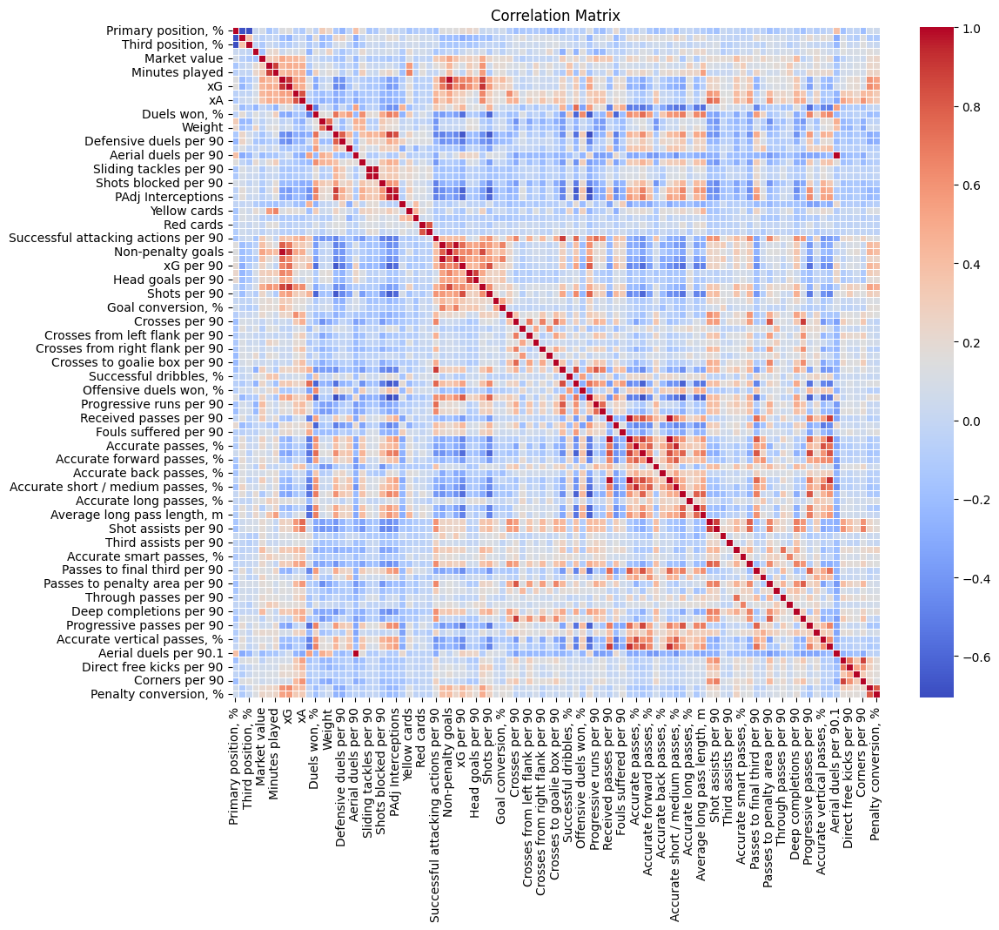

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the float and integer features
numeric_features = data.select_dtypes(include=['float64', 'int64']).drop(columns=['Wyscout id'])

# Compute the correlation matrix
correlation_matrix = numeric_features.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

En la matriz de correlación (imagen 1.3) se puede percibir en los tonos tanto rojo como azul más intenso las correlaciones más fuertes tanto positiva como negativamente, al ser un gran volumen de variables, resulta poco práctico nombrar todas las variables que se correlacionan de forma importante, sin embargo el gráfico resulta muy intereseante para ilustrar alguna correlación en particular que se quisiera analizar.

### Histogramas y Supuestos de Normalidad univariada

Se analiza visualmente qué variables pudieran tener una forma Gaussiana, y por ende pudieran ser estadísticamente significativas en su normalidad.

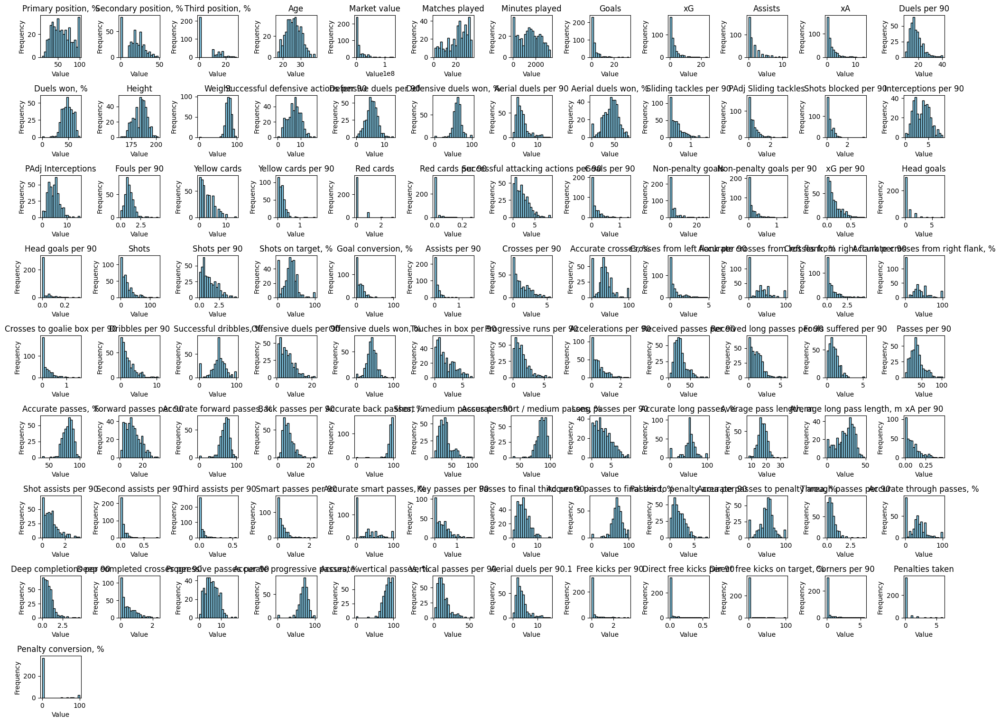

In [131]:
import matplotlib.pyplot as plt

# Get the list of numeric feature column names
numeric_columns = numeric_features.columns

# Calculate the number of rows and columns for the subplots
num_rows = 12
num_cols = 12

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Flatten the axes array
axes = axes.flatten()

# Iterate over the numeric columns and plot histograms
for i, column in enumerate(numeric_columns):
    ax = axes[i]
    ax.hist(data[column].dropna(), bins=20, color='skyblue', edgecolor='black')
    ax.set_title(column)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Remove empty subplots
for j in range(len(numeric_columns), num_rows * num_cols):
    fig.delaxes(axes[j])

# Adjust the spacing between subplots
fig.tight_layout()

# Show the plot
plt.show()

Como se puede ver en la imagen 1.4, al ser muchas variables (más de 100) dificilmente se logrará percibir con claridad la forma normal, sin embargo la imagen ilustra muy bien, si se observa detenidamente, como en su mayoria las distribuciones de las variables tienen formas con medidas de tendencia central muy cargadas hacia la derecha o la izquierda.

Se analiza estadísticamente la normalidad univariada de las variables.

In [132]:
from scipy.stats import shapiro

# List to store the variables that satisfy the normality assumption
variables_with_normality = []

# Iterate over the numeric columns and perform the Shapiro-Wilk test
for column in numeric_columns:
    stat, p_value = shapiro(data[column].dropna())
    if p_value > 0.05:
        variables_with_normality.append(column)
        print(f"Variable '{column}' satisfies the normality assumption.")
        print(f"Shapiro-Wilk test statistic: {stat}")
        print(f"p-value: {p_value}")
        print("---------------------------------------------")

# Check if any variable satisfies the normality assumption
if len(variables_with_normality) == 0:
    print("Ninguna variable cumple con el supuesto de normalidad.")

Variable 'Defensive duels per 90' satisfies the normality assumption.
Shapiro-Wilk test statistic: 0.9928457736968994
p-value: 0.060401950031518936
---------------------------------------------


Como se puede notar en los resultados devueltos por el Test de Shapiro Wilk, en el que se evalua la hipotesis Nula de que los datos provienen de una distribución normal, solo la variable 'Defensive duels per 90' proviene de una distribución normal.
Si se tomara en cuenta Porteros, solo las variables 'Conceded goals per 90', 'Shots against per 90' y 'Prevented goals' cumplen con el supuesto de normaldiad.

### Pruebas de Normalidad Multivarada

Se evalua si las variables en conjunto se ajustan a una distribución normal multivariada. Finalmente se gráfica un QQ plot visualizar el ajuste de los datos vs los cuantiles teóricos en una distribución nornmal multivariada.
En esta parte se extraen también únicamente las variables numéricas del dataset, sobre las cuales se realizaran los análisis posteriores, además, como algunas variables provienen de distinta naturaleza (porcentajes, cantidades, etc) se realiza una estandarización de las mismas.
Además, se eliminan las observaciones que tienen más de 50% de datos faltantes, y las que no cumplen esta condición pero tienen datos faltantes, se imputa con la media de la columna (variable).

In [133]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2
from sklearn.preprocessing import StandardScaler
import pingouin as pg

# Ensure only numeric features are selected
numeric_features = numeric_features.select_dtypes(include=[np.number])

# Drop rows with significant number of missing values (e.g., more than 50% missing)
numeric_features_multivariate = numeric_features.dropna(thresh=numeric_features.shape[1] * 0.5)

# Fill remaining missing values with the mean of each column
numeric_features_multivariate = numeric_features_multivariate.fillna(numeric_features_multivariate.mean())

# Standardize the data
scaler = StandardScaler()
numeric_features_standardized = scaler.fit_transform(numeric_features_multivariate)

Se muestra la prueba de normalidad de Henze-Zikler, además del gráfico QQ Plot.

HZResults(hz=1556, pval=0.0, normal=False)


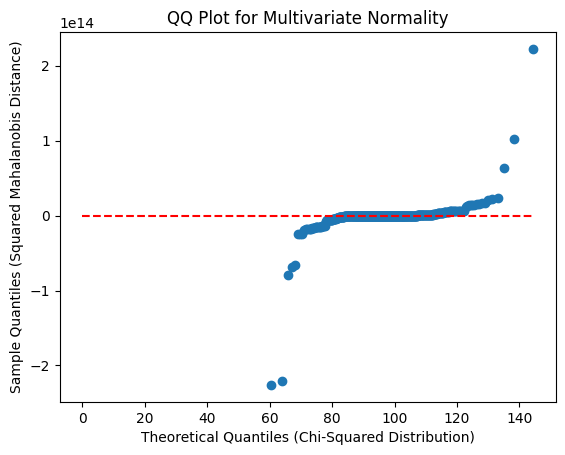

In [134]:

# Check if the standardized array meets the minimum requirements for the test
if numeric_features_standardized.shape[0] >= 3 and numeric_features_standardized.shape[1] >= 2:
    # Perform the multivariate normality test
    normality_test = pg.multivariate_normality(numeric_features_standardized, alpha=0.05)
    print(normality_test)
else:
    print("The DataFrame does not meet the minimum requirements for the multivariate normality test (at least 3 rows and 2 columns).")

# Calculate the covariance matrix
cov_matrix = np.cov(numeric_features_standardized, rowvar=False)

# Calculate the inverse of the covariance matrix
inv_cov_matrix = np.linalg.inv(cov_matrix)

# Calculate the Mahalanobis distance for each observation
mean = np.mean(numeric_features_standardized, axis=0)
mahalanobis_distances = np.array([
    (x - mean).dot(inv_cov_matrix).dot((x - mean).T)
    for x in numeric_features_standardized
])

# Calculate the squared Mahalanobis distances
squared_mahalanobis_distances = mahalanobis_distances

# Degrees of freedom is the number of dimensions
df = numeric_features_standardized.shape[1]

# Plot QQ plot
sorted_distances = np.sort(squared_mahalanobis_distances)
quantiles = chi2.ppf((np.arange(1, len(sorted_distances) + 1) - 0.5) / len(sorted_distances), df)
plt.plot(quantiles, sorted_distances, marker='o', linestyle='none')
plt.plot([0, max(quantiles)], [0, max(quantiles)], color='r', linestyle='--')
plt.xlabel('Theoretical Quantiles (Chi-Squared Distribution)')
plt.ylabel('Sample Quantiles (Squared Mahalanobis Distance)')
plt.title('QQ Plot for Multivariate Normality')
plt.show()

Del test de Henze-Zirkler de Normalidad Multivariada, se obtuvo un p-valor muy pequeño, por lo que se rechaza la hipótesis nula de que los datos tienen una distsribución normal multivariada. Además, del gráfico QQ (imagen 1.5) se puede observar como el ajuste se aleja de una diagonal, indicando una diferencia importante entre los datos observados y los cuantiles teóricos.

#### Vector de Promedios y Desviación Muestral por Variable (Estandarizada)

Debido al alto volumen de variables, se muestra únicamente para las primeras 5 y últimas 5 variables, tanto el vector de promedios como el vector de desviaciones muestrales.

In [166]:
numeric_features_standardized_df = pd.DataFrame(numeric_features_standardized, columns=numeric_features_multivariate.columns)

# Calcular el vector de promedios
mean_vector = numeric_features_standardized_df.mean()

# Calcular los valores de desviación estándar
std_vector = numeric_features_standardized_df.std()

In [173]:
# Mostrar resultados
print("\nValores de Promedios:")
pd.DataFrame(mean_vector).T


Valores de Promedios:


,"Primary position, %","Secondary position, %","Third position, %",Age,Market value,Matches played,Minutes played,Goals,xG,Assists,...,"Accurate progressive passes, %","Accurate vertical passes, %",Vertical passes per 90,Aerial duels per 90.1,Free kicks per 90,Direct free kicks per 90,"Direct free kicks on target, %",Corners per 90,Penalties taken,"Penalty conversion, %"
0,1.278612e-16,-1.369941e-17,-3.424853e-17,-1.826588e-16,3.653176e-17,0.0,-7.306352e-17,-7.306352e-17,-1.095953e-16,3.653176e-17,...,1.004623e-16,9.589587e-16,1.095953e-16,-1.095953e-16,4.109823e-17,-9.132940e-18,-1.826588e-17,4.566470e-17,0.0,0.0


En la tabla 1.6 se puede ver el vector de promedios muestrales de los datos numéricos del conjuto de datos.

In [174]:
print("\nValores de Desviación Estándar:")
pd.DataFrame(std_vector).T


Valores de Desviación Estándar:


,"Primary position, %","Secondary position, %","Third position, %",Age,Market value,Matches played,Minutes played,Goals,xG,Assists,...,"Accurate progressive passes, %","Accurate vertical passes, %",Vertical passes per 90,Aerial duels per 90.1,Free kicks per 90,Direct free kicks per 90,"Direct free kicks on target, %",Corners per 90,Penalties taken,"Penalty conversion, %"
0,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,...,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288,1.001288


En la tabla 1.7 se puede ver el vector de desviaciones estándar muestrales de los datos numéricos del conjuto de datos.

## Análisis de Componentes Principales (PCA)

Se procede a realizar un Análisis de Componentes Principales usando la libreria *sklearn*, se define primero un análisis para todos los componentes del conjunto de datos, dadas sus variables previamente estandarizadas.

In [135]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(numeric_features_standardized)

PCA()

In [136]:
pca.explained_variance_ratio_

array([2.12151716e-01, 1.26226656e-01, 8.10738351e-02, 4.49855370e-02,
       3.71779997e-02, 3.12928198e-02, 3.01096410e-02, 2.27719057e-02,
       2.10520022e-02, 2.08153983e-02, 1.85968920e-02, 1.79901210e-02,
       1.71065458e-02, 1.57694730e-02, 1.51462349e-02, 1.48562351e-02,
       1.42952040e-02, 1.35334261e-02, 1.29374325e-02, 1.22937177e-02,
       1.12467394e-02, 1.08219518e-02, 1.03428652e-02, 9.73692556e-03,
       9.06001627e-03, 8.52812194e-03, 8.10201519e-03, 7.71905513e-03,
       7.42076962e-03, 7.07327413e-03, 6.88911680e-03, 6.58527492e-03,
       6.43235199e-03, 5.89642906e-03, 5.59018905e-03, 5.49705939e-03,
       5.24997204e-03, 4.78481277e-03, 4.63489515e-03, 4.30087103e-03,
       3.94499778e-03, 3.79398319e-03, 3.74974024e-03, 3.62911364e-03,
       3.55816692e-03, 3.34311334e-03, 3.19631298e-03, 3.02719823e-03,
       2.96474873e-03, 2.68777844e-03, 2.59148287e-03, 2.46259387e-03,
       2.33657625e-03, 2.18953060e-03, 2.03169904e-03, 1.89923565e-03,
      

En la tabla 2.1, se muestra la varianza explicada por Componentes. Posteriormente se grafican las varianzas explicadas.

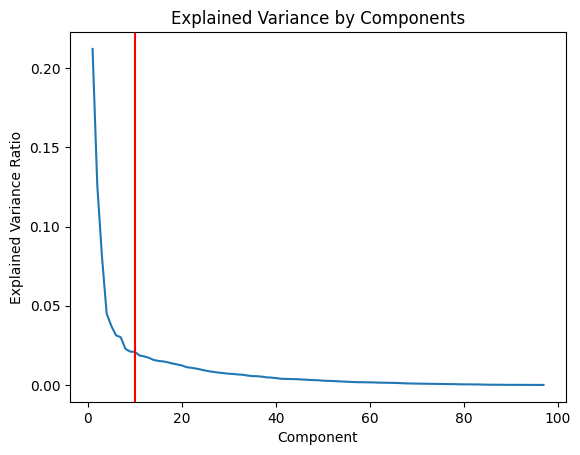

In [137]:
import matplotlib.pyplot as plt

# Plot the explained variance by components
plt.plot(range(1, pca.n_components_ + 1), pca.explained_variance_ratio_)
plt.xlabel('Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Components')
plt.axvline(x=10, color='red')
plt.show()


En la imagen 2.2 se muestra la varianza acumulada por Componentes, para tener mayor visibilidad sobre la varianza explicada por componentes. Sin embargo, como no se percibe tan claro un número de componentes adecuado, se opta por la gráfica de la varianza acumulada (más adelante).

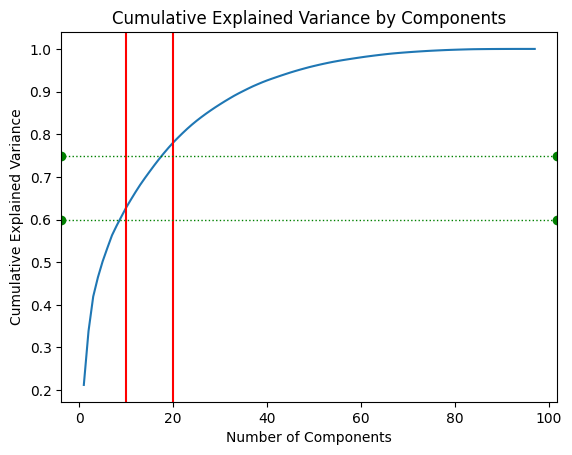

In [138]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate the cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance
plt.plot(range(1, pca.n_components_ + 1), cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Components')
plt.axvline(x=10, color='red')
plt.axvline(x=20, color='red')
plt.axhline(y=0.75, color='green', linestyle=':', linewidth=1, marker='o')
plt.axhline(y=0.6, color='green', linestyle=':', linewidth=1, marker='o')
plt.show()

Se decide tomar 20 componentes basado en la varianza acumulada. Tomando 20 componentes estamos abarcando aproximadamente el 75% de la varianza explicada, justo como se puede observar en la imagen 2.3.

In [ ]:
pca = PCA(n_components=20)
pca.fit(numeric_features_standardized)

In [140]:
scores_pca = pca.transform(numeric_features_standardized)
print(scores_pca)

[[-6.85499438  0.598904    2.02321012 ... -0.2594724   0.41882452
   1.00258088]
 [-5.3729513  -1.89799348  4.11480982 ... -0.59374602  1.67737445
  -0.22314903]
 [-4.62053843 -1.67594055  1.52386309 ... -0.77886683  0.12587355
   1.2083999 ]
 ...
 [-4.30400589 -7.2224994  -3.42852145 ... -1.54203502 -5.13513061
  -3.7639927 ]
 [-7.62865211 -0.3243418   1.22625365 ... -1.38207634  1.47127281
  -2.24166235]
 [ 5.2203275  -7.23037223 -3.60079571 ... -1.78175679 -1.41069285
  -0.39319329]]


En en arreglo (tabla) 2.4 se muestran los puntajes para todos los componentes por jugador del análisis de PCA, más adelante se presenta una gráfica que incluye las observaciones originales junto con los componentes.

In [153]:
eigenvalues = pca.explained_variance_
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

df_eigenvalues = pd.DataFrame({
    'Eigenvalue': eigenvalues,
    'Explained Variance': explained_variance,
    'Cumulative Variance': cumulative_variance
}, index=[f'Component {i+1}' for i in range(len(eigenvalues))])

df_eigenvalues

,Eigenvalue,Explained Variance,Cumulative Variance
Component 1,20.631754,0.212152,0.212152
Component 2,12.275542,0.126227,0.338378
Component 3,7.884430,0.081074,0.419452
Component 4,4.374843,0.044986,0.464438
Component 5,3.615560,0.037178,0.501616
Component 6,3.043227,0.031293,0.532909
Component 7,2.928163,0.030110,0.563018
Component 8,2.214568,0.022772,0.585790
Component 9,2.047307,0.021052,0.606842
Component 10,2.024297,0.020815,0.627658


En la tabla 2.5 se pueden ver los eigenvalores, la proporción de la varianza y la proporción de la varianza acumulada, explicada por cada componente. Aquí se puede ver más claramente como los 20 componentes elegidos abarcan poco más del 75% de la varianza explicada (78%).

In [159]:
# Componentes principales y sus cargas
loadings = pca.components_

# Crear DataFrame de cargas (loadings)
df_loadings = pd.DataFrame(loadings.T, columns=[f'Component {i+1}' for i in range(loadings.shape[0])], index=numeric_features_multivariate.columns)

# Identificar las variables que mayor puntuación tienen en cada componente
top_variables_per_component = {}
for i in range(loadings.shape[0]):
    component = f'Component {i+1}'
    top_variables = df_loadings[component].abs().sort_values(ascending=False).head(10).index.tolist()
    top_variables_per_component[component] = top_variables

print(df_loadings)
pd.DataFrame(top_variables_per_component)

                                Component 1  Component 2  Component 3  \
Primary position, %                0.008775    -0.081846     0.123284   
Secondary position, %             -0.046638     0.073382    -0.096330   
Third position, %                 -0.007038     0.034014    -0.092061   
Age                               -0.022515     0.039905     0.057992   
Market value                       0.043950     0.119242     0.156802   
...                                     ...          ...          ...   
Direct free kicks per 90           0.049809     0.096246    -0.009279   
Direct free kicks on target, %     0.035175     0.075347     0.020779   
Corners per 90                     0.049178     0.144608    -0.072445   
Penalties taken                    0.075934     0.054102     0.149907   
Penalty conversion, %              0.064949     0.048574     0.149087   

                                Component 4  Component 5  Component 6  \
Primary position, %                0.037399     0.

,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,Component 11,Component 12,Component 13,Component 14,Component 15,Component 16,Component 17,Component 18,Component 19,Component 20
0,Touches in box per 90,Aerial duels per 90.1,xG,"Accurate passes, %","Primary position, %",Free kicks per 90,"Accurate crosses, %","Goal conversion, %","Accurate passes to penalty area, %",PAdj Sliding tackles,Red cards,Red cards per 90,Red cards per 90,"Accurate crosses from left flank, %","Accurate smart passes, %","Accurate back passes, %",Crosses from left flank per 90,"Successful dribbles, %",Yellow cards per 90,"Accurate crosses from right flank, %"
1,Forward passes per 90,Aerial duels per 90,Head goals,Short / medium passes per 90,Sliding tackles per 90,Direct free kicks per 90,Through passes per 90,Non-penalty goals per 90,PAdj Sliding tackles,Sliding tackles per 90,Red cards per 90,Red cards,"Accurate through passes, %","Accurate through passes, %","Accurate through passes, %",Yellow cards per 90,Deep completions per 90,Age,"Accurate back passes, %",Crosses from right flank per 90
2,Interceptions per 90,xA,Goals,"Accurate passes to final third, %",Yellow cards,Corners per 90,PAdj Sliding tackles,Goals per 90,"Accurate crosses, %","Defensive duels won, %",Second assists per 90,Second assists per 90,Through passes per 90,"Accurate smart passes, %","Accurate crosses, %",Fouls per 90,"Accurate passes to final third, %","Offensive duels won, %",Accelerations per 90,"Accurate crosses from left flank, %"
3,Successful defensive actions per 90,Passes to penalty area per 90,Non-penalty goals,Received passes per 90,Fouls suffered per 90,Crosses per 90,"Accurate passes to penalty area, %","Secondary position, %",Sliding tackles per 90,"Third position, %","Shots on target, %",Assists,Red cards,"Accurate crosses, %",Fouls suffered per 90,Defensive duels per 90,"Offensive duels won, %",Height,Defensive duels per 90,Crosses from left flank per 90
4,"Duels won, %","Accurate progressive passes, %",Minutes played,Back passes per 90,PAdj Sliding tackles,Penalties taken,Sliding tackles per 90,"Shots on target, %",Direct free kicks per 90,"Primary position, %","Goal conversion, %",Minutes played,Smart passes per 90,"Third position, %","Accurate crosses from right flank, %","Third position, %",Key passes per 90,Weight,"Defensive duels won, %",Third assists per 90
5,Shots per 90,xA per 90,Shots,Age,Fouls per 90,Crosses from right flank per 90,Smart passes per 90,"Successful dribbles, %",Accelerations per 90,"Accurate passes to final third, %",Corners per 90,xA,Crosses to goalie box per 90,"Primary position, %","Accurate passes to penalty area, %",Head goals per 90,Assists per 90,Third assists per 90,"Penalty conversion, %","Penalty conversion, %"
6,PAdj Interceptions,Assists,Head goals per 90,Yellow cards,Defensive duels per 90,"Penalty conversion, %","Accurate crosses from right flank, %","Accurate back passes, %",Age,Direct free kicks per 90,Free kicks per 90,Yellow cards,Assists per 90,Head goals per 90,Through passes per 90,Shots blocked per 90,Matches played,"Accurate crosses from right flank, %",Penalties taken,"Accurate back passes, %"
7,Offensive duels per 90,Deep completed crosses per 90,Goals per 90,"Average pass length, m",Yellow cards per 90,Deep completed crosses per 90,"Accurate crosses from left flank, %","Primary position, %",Smart passes per 90,"Secondary position, %",Duels per 90,Matches played,Second assists per 90,Red cards,"Third position, %","Direct free kicks on target, %","Accurate smart passes, %","Accurate crosses from left flank, %",Shots blocked per 90,Penalties taken
8,xG per 90,Shot assists per 90,Non-penalty goals per 90,"Accurate forward passes, %",Dribbles per 90,Crosses to goalie box per 90,Passes to final third per 90,"Third position, %",Progressive runs per 90,Fouls suffered per 90,Aerial duels per 90.1,Head goals per 90,"Accurate smart passes, %",Red cards 

En los resultados de arriba (tablas 2.6 y 2.7) se puede ver en el primer bloque, el resumen de la carga que tienen las variables en cada componente. En la siguiente tabla se muestran las 10 variables, por componente, que más carga tienen en éste.

<Figure size 1000x600 with 0 Axes>

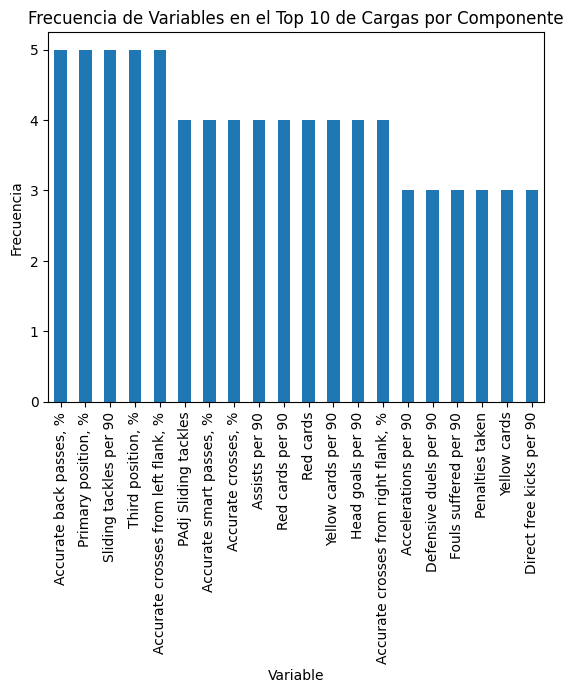

In [162]:
from collections import Counter
import matplotlib.pyplot as plt

# Contar la frecuencia de cada variable en los top 10
all_top_variables = [variable for top_variables in top_variables_per_component.values() for variable in top_variables]
variable_counts = Counter(all_top_variables)

# Crear DataFrame de los conteos y seleccionar el top 20
df_variable_counts = pd.DataFrame.from_dict(variable_counts, orient='index', columns=['Count'])
df_top10_variable_counts = df_variable_counts.sort_values('Count', ascending=False).head(20)

# Crear el histograma
plt.figure(figsize=(10, 6))
df_top10_variable_counts.plot(kind='bar', legend=False)
plt.title('Frecuencia de Variables en el Top 10 de Cargas por Componente')
plt.xlabel('Variable')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.show()


Se visualizó la tabla de variables (imagen 2.8) con mayor carga por componente de forma que se identifica con mayor claridad cuántas veces cada variable resulta con carga importante en las componentes. Se interpreta como, cuántas veces la variable estuvo en el top 10 de variables de más carga entre todos los componentes. Para fines de este breve análisis, solo se enumeran las principales 20 variables acorde a su frecuencia.
Como conclusión se puede ver 5 variables, desde 'Accurate back passes' hasta 'Accurate crosses from left frank' aparecen 5 veces en el top 10 de carga por componente.

## Clusterización por K-Means

### Clasificación de Jugadores por Cluster

Se comienza eligiendo el número de Clusters idea, a través del método de WCSS (Suma de varianzas entre las observaciones de clusters). Arbitrariamente se eligen 40 clusters como máximo.

In [ ]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 40):
    kmeans_pca = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)

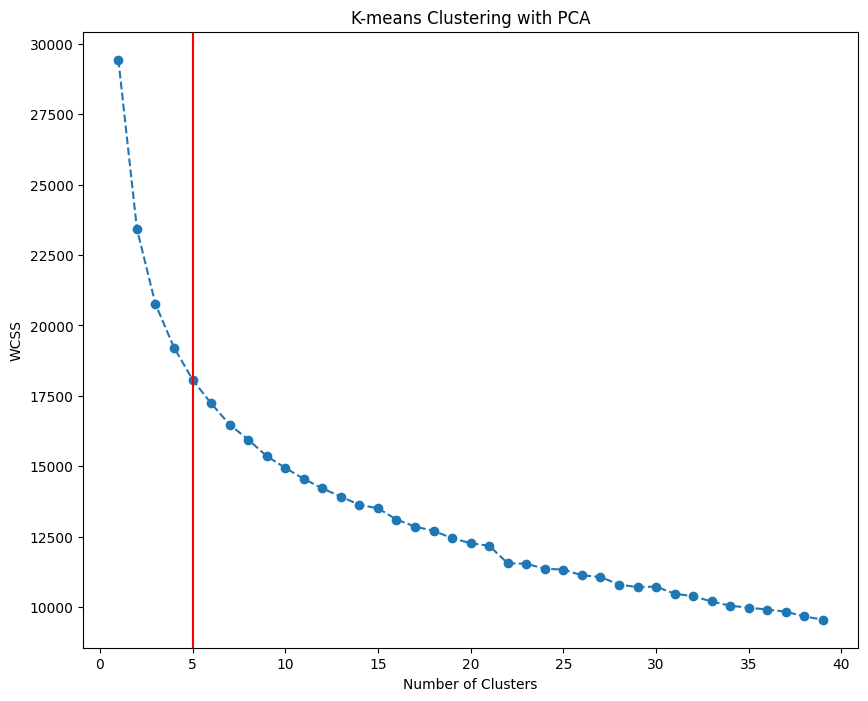

In [142]:
plt.figure(figsize=(10, 8))
plt.plot(range(1, 40), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering with PCA')
plt.axvline(x=5, color='red')
plt.show()

Nuevamente por el método del codo, elegimos el número de Clusters en donde exista una "inflexión" en la gráfica. Para este caso (imagen 3.1) eligiremos 5 Clusters. Posteriormente se implementa la clusterización por K-Means

In [ ]:
kmeans_pca = KMeans(n_clusters=5, init='k-means++', random_state=42)
kmeans_pca.fit(scores_pca)

In [144]:
data = data.loc[numeric_features_multivariate.index] # Se seleccionan los jugadores que resultaron en el análisis de features numéricos

df_segm_pca_kmeans = pd.concat([data.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_segm_pca_kmeans.columns.values[-20:] = ['Component 1', 'Component 2', 'Component 3', 'Component 4', 'Component 5', 'Component 6', 'Component 7', 'Component 8', 'Component 9', 'Component 10', 'Component 11', 'Component 12', 'Component 13', 'Component 14', 'Component 15', 'Component 16', 'Component 17', 'Component 18', 'Component 19', 'Component 20']
df_segm_pca_kmeans['Segment K-means PCA'] = kmeans_pca.labels_
df_segm_pca_kmeans.head()

,Player,Full name,Wyscout id,Team,Team within selected timeframe,Team logo,Competition,Position,Primary position,"Primary position, %",...,Component 12,Component 13,Component 14,Component 15,Component 16,Component 17,Component 18,Component 19,Component 20,Segment K-means PCA
0,W. Pacho,Willian Joel Pacho Tenorio,-74304,Eintracht Frankfurt,Eintracht Frankfurt,https://cdn5.wyscout.com/photos/team/public/9_...,Bundesliga,"LCB3, LCB",LCB3,60,...,-1.662673,-0.689761,1.224412,-0.285383,0.857602,-0.144082,-0.259472,0.418825,1.002581,1
1,P. Mainka,Patrick Mainka,260049,Heidenheim,Heidenheim,https://cdn5.wyscout.com/photos/team/public/37...,Bundesliga,RCB,RCB,98,...,-0.868211,-0.691994,-1.144964,-1.850234,-0.253425,0.530775,-0.593746,1.677374,-0.223149,1
2,Bernardo,Bernardo Fernandes da Silva Junior,328528,Bochum,Bochum,https://cdn5.wyscout.com/photos/team/public/97...,Bundesliga,"LB, LCB3",LB,63,...,-1.816966,-0.276582,-0.097691,1.162612,-0.618241,-0.875638,-0.778867,0.125874,1.208400,1
3,F. Uduokhai,Felix Uduokhai,359831,Augsburg,Augsburg,https://cdn5.wyscout.com/photos/team/public/34...,Bundesliga,"LCB, LCB3",LCB,76,...,-0.124731,1.061685,0.916057,-0.237660,0.414548,0.311141,-0.733599,-0.543934,-0.141017,1
4,W. Anton,Waldemar Anton,307802,Stuttgart,Stuttgart,https://cdn5.wyscout.com/photos/team/public/96...,Bundesliga,"RCB, CB, LCB",RCB,56,...,-1.659126,0.075131,-0.073524,0.746975,0.859127,-1.068669,0.016958,-0.608110,0.071849,1


En la tabla 3.2 se puede ver la tabla de datos completa, incluyendo los 20 componentes obtenidos del PCA (puntajes de las nuevas variables), en la última columna se muestra la etiqueta o Cluster asignado del algoritmo de K-Means.

### Análisis Descriptivos de Clusters

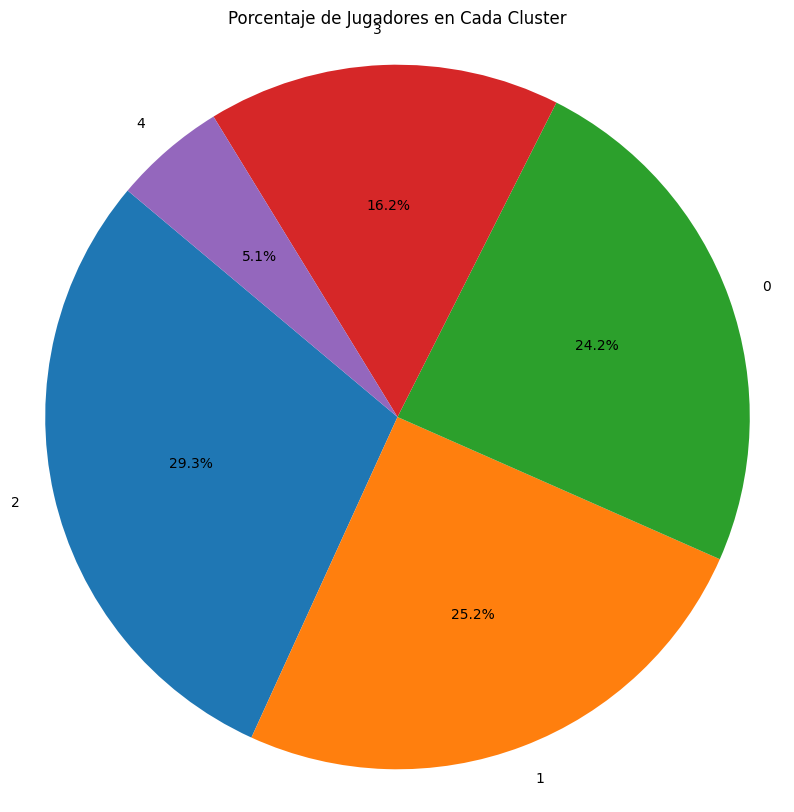

In [151]:
import matplotlib.pyplot as plt

# Contar el número de jugadores en cada cluster
cluster_counts = df_segm_pca_kmeans['Segment K-means PCA'].value_counts()

# Calcular los porcentajes
cluster_percentages = cluster_counts / cluster_counts.sum() * 100

# Crear el gráfico de pastel
plt.figure(figsize=(10, 10))
plt.pie(cluster_percentages, labels=cluster_percentages.index, autopct='%1.1f%%', startangle=140)
plt.title('Porcentaje de Jugadores en Cada Cluster')
plt.axis('equal')  # Para asegurar que el gráfico de pastel sea un círculo.
plt.show()


Del gráfico de pastel (imagen 3.3) se identifica una distribución relativamente balanceada de los clusters en los datos. El Cluster 4 es el único que presenta una proporción mucho más pequeña a sus relativos.

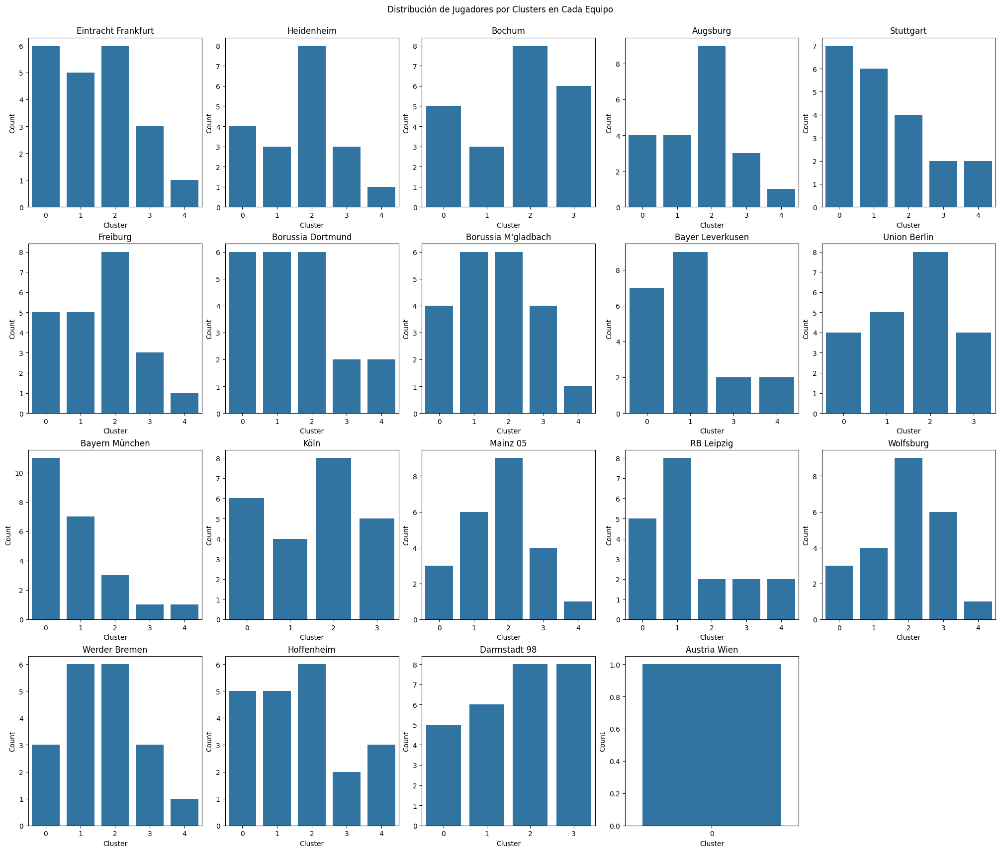

In [147]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Obtener una lista única de equipos
teams = df_segm_pca_kmeans['Team'].unique()

# Determinar el tamaño de la cuadrícula
num_teams = len(teams)
grid_size = 5

# Crear la figura y los ejes para la cuadrícula de subplots
fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20), constrained_layout=True)

# Asegurarse de que todos los ejes estén activos
axes = axes.flatten()

# Iterar sobre cada equipo y crear un gráfico de barras
for i, team in enumerate(teams):
    ax = axes[i]
    team_data = df_segm_pca_kmeans[df_segm_pca_kmeans['Team'] == team]
    sns.countplot(data=team_data, x='Segment K-means PCA', ax=ax)
    ax.set_title(team)
    ax.set_xlabel('Cluster')
    ax.set_ylabel('Count')

# Desactivar los ejes restantes si hay menos equipos que subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Mostrar el gráfico
plt.suptitle('Distribución de Jugadores por Clusters en Cada Equipo', y=1.02)
plt.show()


Los resultados del cluster muestran conclusiones muy interesantes (imagen 3.4), ya que, dejando a un lado la clusterización sugerida dentro de los equipos, esperarías que lo "normal" fuera que cada equipo tuviera una distribución adcuada de jugadores segun sus características, es decir, si tu "agruparas" a tus jugadores por sus estadísticas en el juego, esperarías que como resultado tuvieras un número balanceado de jugadores en cada uno de estos grupos. Por ello es interesante como matemáticamente, el algoritmo de K-Means a pesar de no agrupar de forma "balanceada" a los jugadores en su Cluster, sí se logra percibir como por cada equipo existe por lo menos un jugador en alguno de estos Clusters de características similares, sugiriendo así, que los equipos tienen un balanceo esperado en los grupos de jugadores por características o cualidades similares.

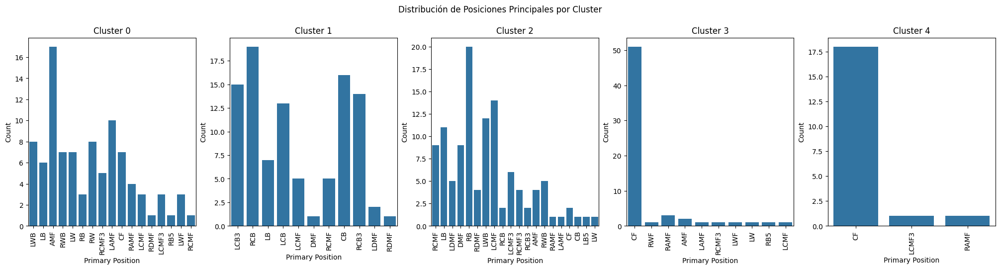

In [150]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Obtener una lista única de posiciones principales
positions = df_segm_pca_kmeans['Primary position'].unique()

# Determinar el tamaño de la cuadrícula
num_clusters = len(df_segm_pca_kmeans['Segment K-means PCA'].unique())
grid_size = 5

# Crear la figura y los ejes para la cuadrícula de subplots
fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20), constrained_layout=True)

# Asegurarse de que todos los ejes estén activos
axes = axes.flatten()

# Iterar sobre cada cluster y crear un gráfico de barras
for i in range(num_clusters):
    ax = axes[i]
    cluster_data = df_segm_pca_kmeans[df_segm_pca_kmeans['Segment K-means PCA'] == i]
    sns.countplot(data=cluster_data, x='Primary position', ax=ax)
    ax.set_title(f'Cluster {i}')
    ax.set_xlabel('Primary Position')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=90)

# Desactivar los ejes restantes si hay menos clusters que subplots
for j in range(num_clusters, len(axes)):
    fig.delaxes(axes[j])

# Mostrar el gráfico
plt.suptitle('Distribución de Posiciones Principales por Cluster', y=1.02)
plt.show()


En estas visualizaciones (imagen 3.5) se puede identificar la distribución de posiciones de jugadores por clusters. Por ahora no se identifica un patrón claro, sin embargo se considera importante tener esta perspectiva.

Posteriormente se gráfica (imagen 3.6) por pares los 20 componentes para identificar la coloración dado el segmento asignado, o cluster. Esta vista es muy interesante para percibir como se forman los grupos asumiento que cada componente se gráfica por partes en un plano bidimensional.

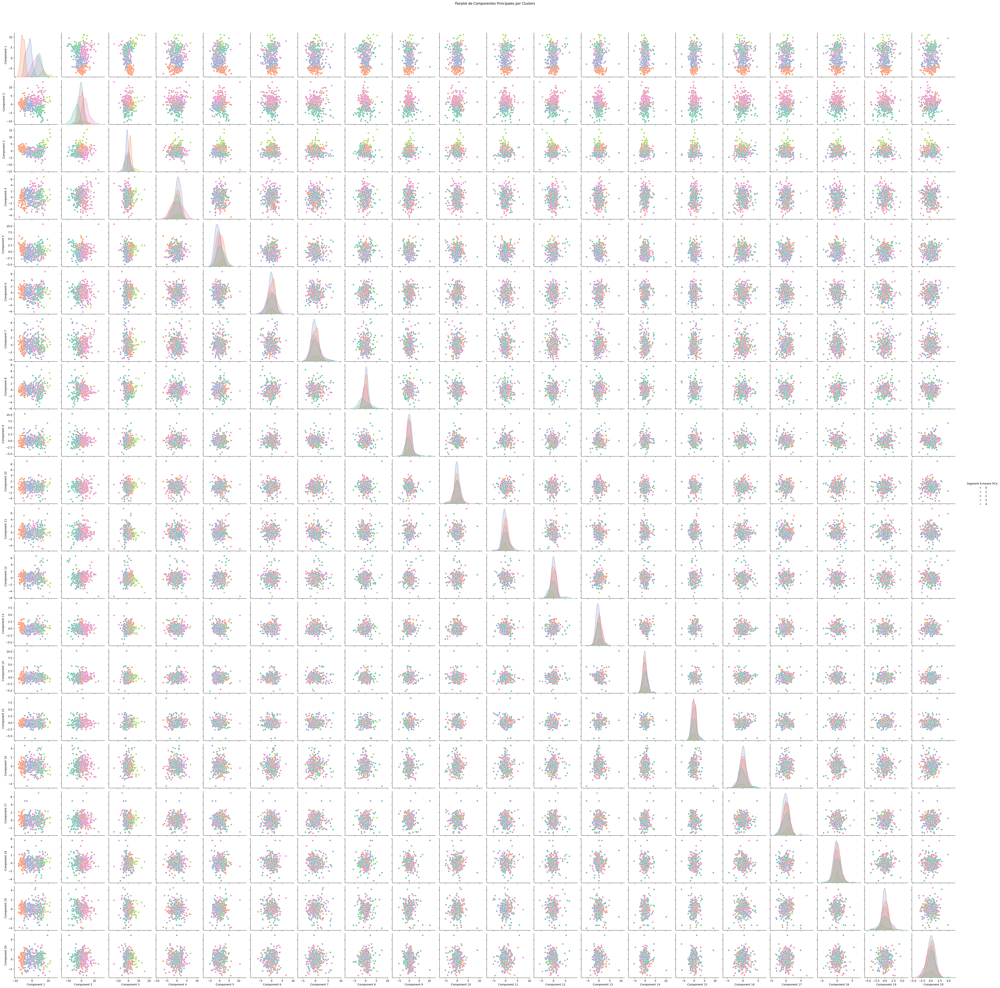

In [111]:
sns.pairplot(df_segm_pca_kmeans, vars=['Component 1', 'Component 2', 'Component 3', 'Component 4', 'Component 5', 'Component 6', 'Component 7', 'Component 8', 'Component 9', 'Component 10', 'Component 11', 'Component 12', 'Component 13', 'Component 14', 'Component 15', 'Component 16', 'Component 17', 'Component 18', 'Component 19', 'Component 20'], hue='Segment K-means PCA', palette='Set2')
plt.suptitle('Pairplot de Componentes Principales por Clusters', y=1.02)
plt.show()


## Conclusiones Generales

Los distintos análisis descriptivos y de técnicas multivariadas empleadas describieron de forma interesante los datos, y puntualmente después de cada observación logramos obtener conclusiones importantes. Sin embargo, a pesar de estas conclusiones puntuales, podemos resumir nuestra investigación en algunas conclusiones clave que van de la mano con el planteamiento del problema y el objetivo.
Los resultados de la segmentación de jugadores y su distribución dentro de cada equipo de la Bundesliga resulta muy interesante, ya que dejando a un lado la clusterización realizada (o el algoritmo matemático), se esperaría que lo "normal" fuera que cada equipo tuviera una distribución adecuada de jugadores segun sus características, mientras que, matemáticamente el algoritmo de K-Means a pesar de no agrupar de forma "balanceada" a los jugadores en su Cluster, logra percibir como por cada equipo existe por lo menos un jugador en alguno de estos Clusters de características similares. 
Lo más importante de este análisis es, que considero que queda abierto para su profundización, ya sea analizando las características o estilos de jugadores predominantes en los clusters, u otros análisis posteriores cuya base dependa de una segmentación como la realizada en esta investigación.

## Bibliografía

- https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.shapiro.html
- https://pingouin-stats.org/build/html/generated/pingouin.multivariate_normality.html
- https://365datascience.com/tutorials/python-tutorials/pca-k-means/
- https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
- https://365datascience.com/tutorials/python-tutorials/k-means-clustering/